# COURSERA CAPSTONE

## Battle of the Neighborhoods
### __Best Place in NYC for Italian Restuarants__


### -------------------------------------------------------------------------------------------------------

#### BUSINESS PROBLEM

New York City, the proverbial ‘Melting Pot’ of the world, is home to the most ethnically diverse population. A home for immigrants from world over, it is but natural that the city is also a gastronomical delight for food lovers across the world, with its rich and varied cuisines reflected in multitude of restaurants catering to cuisines from all over the world. Be it Italian, Mexican, Chinese, Korean, Indian, Lebanese, French, Ethiopian, Japanese – there isn’t a single known world cuisine that does not find itself being represented in some way in this great city.
New York is a major metropolitan area with more than 8.4 million people living within city limits.

Now coming to the problem at hand, ours is a client very much into the restaurant business, and given the popularity of Italian cuisine, looking for opportunities to make a mark by serving the best Italian cuisine in New York City. 
But given the vastness of the city and the varied neighborhoods, they face a vexing problem:

What would be the ‘Best’ possible location to open a swanky new Italian restaurant in NYC, so that it would do well?

To be able to answer this question, one would need to develop an understanding of the current Italian food scene in NYC including 
1.how many Italian restaurants are there presently in NYC, 
2.where are they located, 
3.where are the best rated italian restaurants, 

The below analysis tries to answer these questions.




### __Data__
In order to answer the above questions, the data required includes:

New York City neighborhoods and borough with thier boundries, latitudes & longitudes

NYC restaurants, particularly Italian restaurants, along with their stats like Ratings, Tips etc.

The data sources that we propose to use are listed below:

New York City data containing the neighborhoods and boroughs, latitudes, and longitudes will be obtained from the data source: https://cocl.us/new_york_dataset

New York City data containing neighborhood boundaries will be obtained from the data source: https://data.cityofnewyork.us/City-Government/Borough-Boundaries/tqmj-j8zm

All data related to locations and quality of Italian restaurants will be obtained via the FourSquare API utilized via the Request library in Python.



### Methodology
•	Data will be collected from https://cocl.us/new_york_dataset and cleaned and processed into a dataframe.

•	FourSquare be used to locate all venues and then filtered by Italian restaurants.  Ratings, tips, and likes by users will be counted and added to the dataframe.

•	Data will be sorted based on rankings

•	Finally, the data be will be visually assessed using graphing from various Python libraries.

### Problem Statement
1.	What would be the ‘Best’ possible location to open a swanky new Italian restaurant in NYC, so that it would do well?
2.	How may Italian restaurants are there in NYC and how are they spread / distributed across different boroughs and neighborhoods?
3.	Where would I go in New York City to have the best Italian food? / Where are the best rated Italian restaurants located in NYC?

Load Libraries

In [2]:
import pandas as pd
import numpy as np
import requests
#from bs4 import BeautifulSoup
import os
#!conda install -c conda-forge folium=0.5.0 --yes
#import folium 
#!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim 
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
%matplotlib inline
import seaborn as sns

print('Import of libraries successfull!')

Import of libraries successfull!


In [3]:
!pip -q install folium

print("Folium Installed")

Folium Installed


In [4]:
!pip -q install geopy

print("Installed geopy")

Installed geopy


My variables [Foursquare]

In [1]:
# The code was removed by Watson Studio for sharing.
CLIENT_ID = '' your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

#print('Your credentails:')
#print('CLIENT_ID: ' + CLIENT_ID)
#print('CLIENT_SECRET:' + CLIENT_SECRET)

Defining functions to be used during the course of the analysis

In [6]:
def geo_location(address):
    # get geo location of address
    geolocator = Nominatim(user_agent="foursquare_agent")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
    return latitude,longitude


def get_venues(lat,lng):
    #set variables
    radius=400
    LIMIT=100
    #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
    # get all the data
    results = requests.get(url).json()
    venue_data=results["response"]['groups'][0]['items']
    venue_details=[]
    for row in venue_data:
        try:
            venue_id=row['venue']['id']
            venue_name=row['venue']['name']
            venue_category=row['venue']['categories'][0]['name']
            venue_details.append([venue_id,venue_name,venue_category])
        except KeyError:
            pass
    column_names=['ID','Name','Category']
    df = pd.DataFrame(venue_details,columns=column_names)
    return df


def get_venue_details(venue_id):
    #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/{}?&client_id={}&client_secret={}&v={}'.format(
            venue_id,
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION)
    # get all the data
    results = requests.get(url).json()
    print(results)
    venue_data=results['response']['venue']
    venue_details=[]
    try:
        venue_id=venue_data['id']
        venue_name=venue_data['name']
        venue_likes=venue_data['likes']['count']
        venue_rating=venue_data['rating']
        venue_tips=venue_data['tips']['count']
        venue_details.append([venue_id,venue_name,venue_likes,venue_rating,venue_tips])
    except KeyError:
        pass
    column_names=['ID','Name','Likes','Rating','Tips']
    df = pd.DataFrame(venue_details,columns=column_names)
    return df
  


def get_new_york_data():
    url='https://cocl.us/new_york_dataset'
    resp=requests.get(url).json()
    # all data is present in features label
    features=resp['features']
    # define the dataframe columns
    column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 
    # instantiate the dataframe
    new_york_data = pd.DataFrame(columns=column_names)
    for data in features:
        borough = data['properties']['borough'] 
        neighborhood_name = data['properties']['name']
        neighborhood_latlon = data['geometry']['coordinates']
        neighborhood_lat = neighborhood_latlon[1]
        neighborhood_lon = neighborhood_latlon[0]
        new_york_data = new_york_data.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)
    return new_york_data

Getting data for New York City

In [7]:
ny_data = get_new_york_data()
ny_data

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585
5,Bronx,Kingsbridge,40.881687,-73.902818
6,Manhattan,Marble Hill,40.876551,-73.910660
7,Bronx,Woodlawn,40.898273,-73.867315
8,Bronx,Norwood,40.877224,-73.879391
9,Bronx,Williamsbridge,40.881039,-73.857446


In [8]:
ny_data.shape

(306, 4)

Exploratory Data Analysis

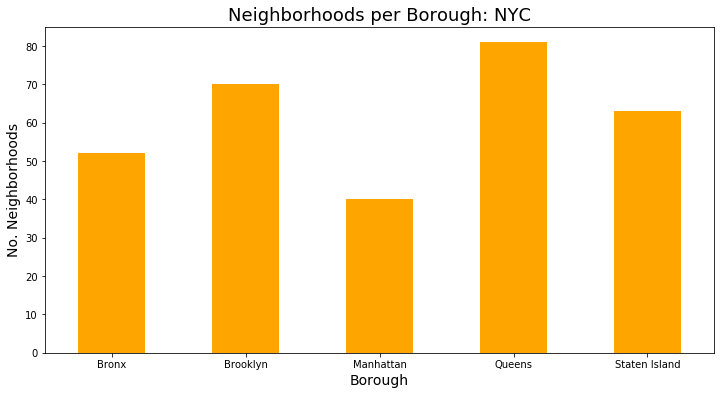

In [9]:
clr = "orange"
ny_data.groupby('Borough')['Neighborhood'].count().plot.bar(figsize=(12,6), color=clr)
plt.title('Neighborhoods per Borough: NYC', fontsize = 18)
plt.xlabel('Borough', fontsize = 14)
plt.ylabel('No. Neighborhoods',fontsize = 14)
plt.xticks(rotation = 'horizontal')
plt.show()

## Above graph shows that Manhattan borough has the least neighborhoods while Queens has the most neighborhoods

##Lets analyze further and see how many Italian restaurants there are in each neighborhood and burough and graph the results.

In [10]:
# queens has most neighborhoods
# prepare neighborhood list that contains indian resturants
column_names=['Borough', 'Neighborhood', 'ID','Name']
italian_rest_ny=pd.DataFrame(columns=column_names)
count=1
for row in ny_data.values.tolist():
    Borough, Neighborhood, Latitude, Longitude=row
    venues = get_venues(Latitude,Longitude)
    italian_resturants=venues[venues['Category']=='Italian Restaurant']   
    print('(',count,'/',len(ny_data),')','Italian Resturants in '+Neighborhood+', '+Borough+':'+str(len(italian_resturants)))
    print(row)
    for resturant_detail in italian_resturants.values.tolist():
        id, name , category=resturant_detail
        italian_rest_ny = italian_rest_ny.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name
                                               }, ignore_index=True)
    count+=1

( 1 / 306 ) Italian Resturants in Wakefield, Bronx:0
['Bronx', 'Wakefield', 40.89470517661, -73.84720052054902]
( 2 / 306 ) Italian Resturants in Co-op City, Bronx:0
['Bronx', 'Co-op City', 40.87429419303012, -73.82993910812398]
( 3 / 306 ) Italian Resturants in Eastchester, Bronx:0
['Bronx', 'Eastchester', 40.887555677350775, -73.82780644716412]
( 4 / 306 ) Italian Resturants in Fieldston, Bronx:0
['Bronx', 'Fieldston', 40.89543742690383, -73.90564259591682]
( 5 / 306 ) Italian Resturants in Riverdale, Bronx:0
['Bronx', 'Riverdale', 40.890834493891305, -73.9125854610857]
( 6 / 306 ) Italian Resturants in Kingsbridge, Bronx:0
['Bronx', 'Kingsbridge', 40.88168737120521, -73.90281798724604]
( 7 / 306 ) Italian Resturants in Marble Hill, Manhattan:0
['Manhattan', 'Marble Hill', 40.87655077879964, -73.91065965862981]
( 8 / 306 ) Italian Resturants in Woodlawn, Bronx:1
['Bronx', 'Woodlawn', 40.89827261213805, -73.86731496814176]
( 9 / 306 ) Italian Resturants in Norwood, Bronx:0
['Bronx', '

In [11]:
italian_rest_ny.to_csv('italian_rest_ny.csv') # Save the information so far to a .csv file due to limited calls on FourSquare

In [12]:
italian_rest_ny = pd.read_csv('italian_rest_ny.csv')
italian_rest_ny.head(25)

,Unnamed: 0,Borough,Neighborhood,ID,Name
0,0,Bronx,Woodlawn,511edb6de4b0d58346fd272d,Patrizia's Of Woodlawn
1,1,Bronx,Pelham Parkway,4bf96ae65317a593d837017f,Enzo's
2,2,Bronx,Pelham Parkway,4b47f069f964a5208c4426e3,Pasta Pasta
3,3,Bronx,City Island,4514ed4df964a520e5391fe3,Artie's Steak and Seafood
4,4,Bronx,Parkchester,5197f6507dd2310725c35f1e,Lorraine's Bar and Grill
5,5,Bronx,Morris Park,4b10591af964a5205f6e23e3,Patricia's
6,6,Bronx,Belmont,4acf80aef964a52025d420e3,Tino's Delicatessen
7,7,Bronx,Belmont,4af71916f964a520cf0522e3,Michaelangelo's Coal Fired Brick Oven Pizza Re...
8,8,Bronx,Belmont,59050f51b23dfa5f6649e678,Arthur Avenue Fiasco
9,9,Bronx,Belmont,4bb6470cef159c7465b275f7,Calabria Pork Store


In [13]:
italian_rest_ny.shape

(237, 5)

In [14]:
italian_rest_ny=italian_rest_ny.drop(italian_rest_ny.columns[0], axis=1)

In [15]:
italian_rest_ny.head(5)

,Borough,Neighborhood,ID,Name
0,Bronx,Woodlawn,511edb6de4b0d58346fd272d,Patrizia's Of Woodlawn
1,Bronx,Pelham Parkway,4bf96ae65317a593d837017f,Enzo's
2,Bronx,Pelham Parkway,4b47f069f964a5208c4426e3,Pasta Pasta
3,Bronx,City Island,4514ed4df964a520e5391fe3,Artie's Steak and Seafood
4,Bronx,Parkchester,5197f6507dd2310725c35f1e,Lorraine's Bar and Grill


Manhattan, though having the least neighborhoods, seems to have the highest concentration of Italian restaurants ~100.
However, the neighborhood with the highest number of Italian restaurants is Belmont (17 Italian restaurants) which is in the borough of 'The Bronx'.

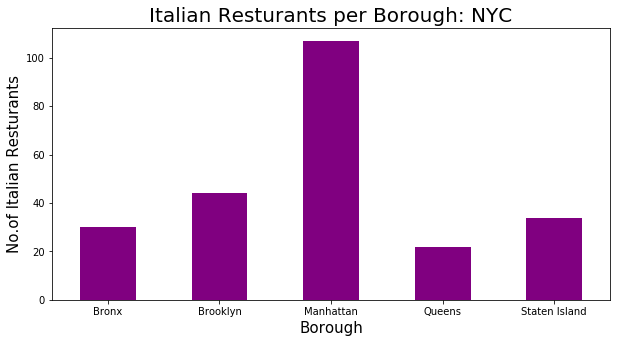

In [16]:
italian_rest_ny.groupby('Borough')['ID'].count().plot.bar(figsize=(10,5), color = "purple")
plt.title('Italian Resturants per Borough: NYC', fontsize = 20)
plt.xlabel('Borough', fontsize = 15)
plt.ylabel('No.of Italian Resturants', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()

Below graph plots the top 10 neighborhoods with Italian restaurants.

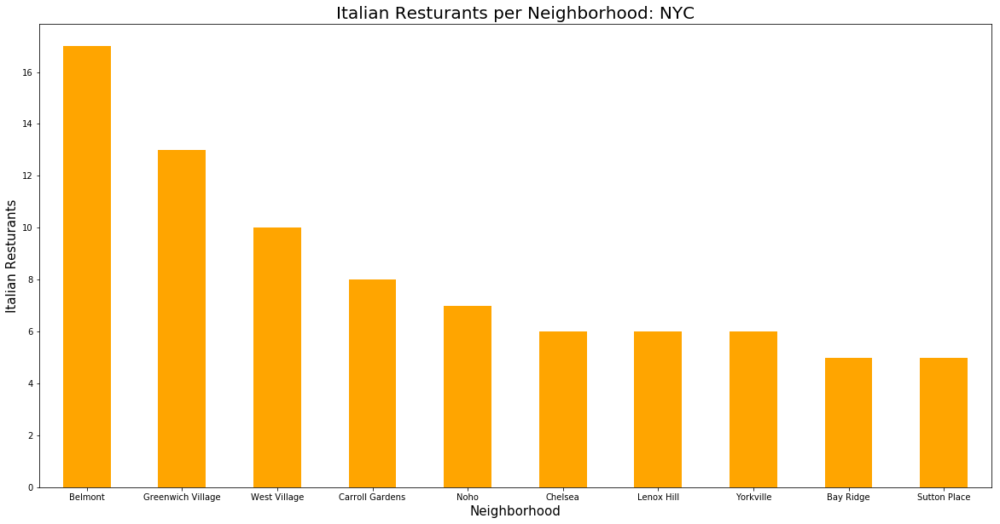

In [17]:
NOofNeigh = 10
italian_rest_ny.groupby('Neighborhood')['ID'].count().nlargest(NOofNeigh).plot.bar(figsize=(20,10), color=clr)
plt.title('Italian Resturants per Neighborhood: NYC', fontsize = 20)
plt.xlabel('Neighborhood', fontsize = 15)
plt.ylabel('Italian Resturants', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()

In [18]:
italian_rest_ny[italian_rest_ny['Neighborhood']=='Belmont']

,Borough,Neighborhood,ID,Name
6,Bronx,Belmont,4acf80aef964a52025d420e3,Tino's Delicatessen
7,Bronx,Belmont,4af71916f964a520cf0522e3,Michaelangelo's Coal Fired Brick Oven Pizza Re...
8,Bronx,Belmont,59050f51b23dfa5f6649e678,Arthur Avenue Fiasco
9,Bronx,Belmont,4bb6470cef159c7465b275f7,Calabria Pork Store
10,Bronx,Belmont,4aa425bef964a5208e4520e3,Dominick's Restaurant
11,Bronx,Belmont,4af0fa29f964a52060e021e3,Antonio's Trattoria
12,Bronx,Belmont,4b5514c4f964a5207cda27e3,Enzo's
13,Bronx,Belmont,4c9b9e7b9c663704b90463fd,Gerbasi Ristorante
14,Bronx,Belmont,4c79d294278eb713f6a05580,Cafe al Mercato
15,Bronx,Belmont,4b5a4c8ff964a52049bb28e3,Emilia's Restaurant


In [19]:
italian_rest_ny.head(5)

,Borough,Neighborhood,ID,Name
0,Bronx,Woodlawn,511edb6de4b0d58346fd272d,Patrizia's Of Woodlawn
1,Bronx,Pelham Parkway,4bf96ae65317a593d837017f,Enzo's
2,Bronx,Pelham Parkway,4b47f069f964a5208c4426e3,Pasta Pasta
3,Bronx,City Island,4514ed4df964a520e5391fe3,Artie's Steak and Seafood
4,Bronx,Parkchester,5197f6507dd2310725c35f1e,Lorraine's Bar and Grill


In [20]:
column_names=['Borough', 'Neighborhood', 'ID','Name','Likes','Rating','Tips']
italian_rest_stats_ny=pd.DataFrame(columns=column_names)
count=1
for row in italian_rest_ny.values.tolist():
    Borough,Neighborhood,ID,Name=row 
    try:
        venue_details=get_venue_details(ID)
        print(venue_details)
        id,name,likes,rating,tips=venue_details.values.tolist()[0]
    except IndexError:
        print('No data available for id=',id)
        # Assign 0 value for these resturants as they may have been 
        #recently opened or details do not exist in FourSquare Database
        id,name,likes,rating,tips=[0]*5
    print('(',count,'/',len(italian_rest_ny),')','processed')
    italian_rest_stats_ny = italian_rest_stats_ny.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : Name,
                                                'Likes' : likes,
                                                'Rating' : rating,
                                                'Tips' : tips
                                               }, ignore_index=True)
    count+=1
italian_rest_stats_ny.tail()

{'meta': {'code': 200, 'requestId': '5e74b3890cc1fd001b0dadce'}, 'response': {'venue': {'id': '511edb6de4b0d58346fd272d', 'name': "Patrizia's Of Woodlawn", 'contact': {'phone': '7188845700', 'formattedPhone': '(718) 884-5700'}, 'location': {'address': '4358 Katonah Ave', 'lat': 40.900638399332884, 'lng': -73.86772361835486, 'labeledLatLngs': [{'label': 'display', 'lat': 40.900638399332884, 'lng': -73.86772361835486}], 'postalCode': '10470', 'cc': 'US', 'city': 'Bronx', 'state': 'NY', 'country': 'United States', 'formattedAddress': ['4358 Katonah Ave', 'Bronx, NY 10470', 'United States']}, 'canonicalUrl': 'https://foursquare.com/v/patrizias-of-woodlawn/511edb6de4b0d58346fd272d', 'categories': [{'id': '4bf58dd8d48988d110941735', 'name': 'Italian Restaurant', 'pluralName': 'Italian Restaurants', 'shortName': 'Italian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/italian_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 14}, 'url': 'http:

,Borough,Neighborhood,ID,Name,Likes,Rating,Tips
232,Manhattan,Flatiron,5cc3adaa838e59002cb4629d,Rezdôra,67,8.5,19
233,Manhattan,Flatiron,53370455498e18d7e6607a1d,La Pizza & La Pasta,200,8.6,57
234,Brooklyn,Fulton Ferry,593c0d2262420b7feccc3048,Cecconi's,332,8.8,72
235,Brooklyn,Dumbo,593c0d2262420b7feccc3048,Cecconi's,332,8.8,72
236,Staten Island,Lighthouse Hill,5079ccdce4b065f1dd8155ad,Casa verde,8,7.8,3


In [21]:
italian_rest_stats_ny.to_csv('italian_rest_stats_ny_csv.csv') 

In [22]:
italian_rest_stats_ny.shape

(237, 7)

In [23]:
italian_rest_stats_ny.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 237 entries, 0 to 236
Data columns (total 7 columns):
Borough         237 non-null object
Neighborhood    237 non-null object
ID              237 non-null object
Name            237 non-null object
Likes           237 non-null object
Rating          237 non-null float64
Tips            237 non-null object
dtypes: float64(1), object(6)
memory usage: 13.0+ KB


In [24]:
italian_rest_stats_ny['Likes']=italian_rest_stats_ny['Likes'].astype('float64')
italian_rest_stats_ny['Tips']=italian_rest_stats_ny['Tips'].astype('float64')
italian_rest_stats_ny.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 237 entries, 0 to 236
Data columns (total 7 columns):
Borough         237 non-null object
Neighborhood    237 non-null object
ID              237 non-null object
Name            237 non-null object
Likes           237 non-null float64
Rating          237 non-null float64
Tips            237 non-null float64
dtypes: float64(3), object(4)
memory usage: 13.0+ KB


In [25]:
italian_rest_stats_ny.describe()

,Likes,Rating,Tips
count,237.000000,237.000000,237.000000
mean,129.607595,7.465401,51.662447
std,227.018334,2.142623,102.442770
min,0.000000,0.000000,0.000000
25%,15.000000,7.400000,7.000000
50%,40.000000,8.000000,18.000000
75%,114.000000,8.500000,51.000000
max,1452.000000,9.500000,1136.000000


In [26]:
# Resturant with maximum Likes
italian_rest_stats_ny.iloc[italian_rest_stats_ny['Likes'].idxmax()]

Borough                        Manhattan
Neighborhood                    Gramercy
ID              4afb2990f964a520a91b22e3
Name                            Maialino
Likes                               1452
Rating                               9.1
Tips                                 464
Name: 142, dtype: object

In [27]:
# Resturant with maximum Ratings
italian_rest_stats_ny.iloc[italian_rest_stats_ny['Rating'].idxmax()]

Borough                         Brooklyn
Neighborhood                    Bushwick
ID              5a98aed16a59506d7a60d67c
Name                          Carmenta’s
Likes                                 51
Rating                               9.5
Tips                                  21
Name: 39, dtype: object

In [28]:
# Resturant with maximum Tips
italian_rest_stats_ny.iloc[italian_rest_stats_ny['Tips'].idxmax()]

Borough                    Staten Island
Neighborhood               West Brighton
ID              4b5b58dbf964a52088f628e3
Name                        Panini Grill
Likes                                 21
Rating                               8.5
Tips                                1136
Name: 172, dtype: object

In [29]:
ny_neighborhood_stats=italian_rest_stats_ny.groupby('Neighborhood',as_index=False).mean()[['Neighborhood','Rating']]
ny_neighborhood_stats.columns=['Neighborhood','Average Rating']
ny_neighborhood_stats.sort_values(['Average Rating'],ascending=False).head(20)

,Neighborhood,Average Rating
12,Bushwick,9.500000
86,Tribeca,9.200000
11,Boerum Hill,9.200000
45,Hamilton Heights,9.000000
81,Soho,8.900000
56,Lower East Side,8.900000
28,Dumbo,8.800000
38,Fulton Ferry,8.800000
25,Corona,8.800000
44,Greenwich Village,8.700000


In [30]:
ny_borough_stats=italian_rest_stats_ny.groupby('Borough',as_index=False).mean()[['Borough','Rating']]
ny_borough_stats.columns=['Borough','Average Rating']
ny_borough_stats.sort_values(['Average Rating'],ascending=False).head(20)

,Borough,Average Rating
2,Manhattan,8.312150
0,Bronx,7.626667
1,Brooklyn,7.595455
3,Queens,7.145455
4,Staten Island,4.697059


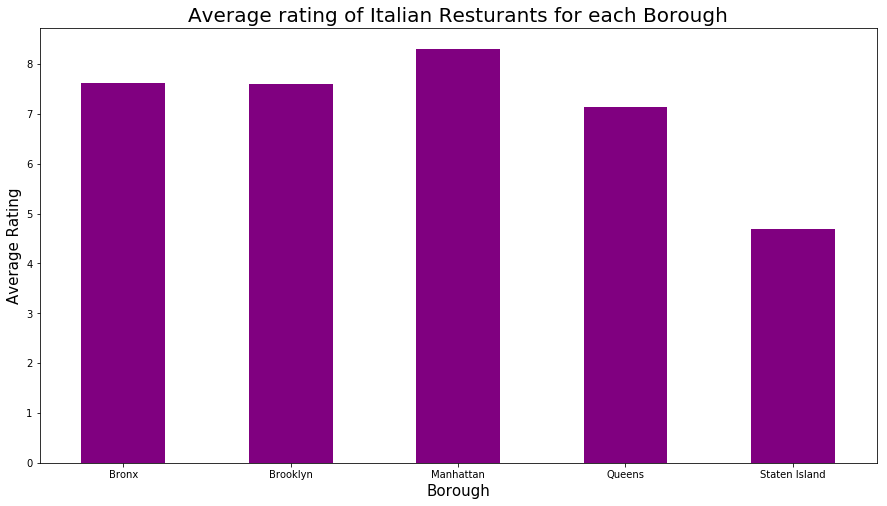

In [31]:
italian_rest_stats_ny.groupby('Borough').mean()['Rating'].plot.bar(figsize=(15,8), color="purple")
plt.title('Average rating of Italian Resturants for each Borough', fontsize=20)
#On x-axis
plt.xlabel('Borough', fontsize = 15)
#On y-axis
plt.ylabel('Average Rating', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()

Visually map the neighborhoods with an average rating greater than or equal to 8 after joining the dataframes to include latitudes and longitudes.

In [32]:
ny_neighborhood_stats=ny_neighborhood_stats[ny_neighborhood_stats['Average Rating']>=8.0]
ny_neighborhood_stats

,Neighborhood,Average Rating
2,Auburndale,8.000000
11,Boerum Hill,9.200000
12,Bushwick,9.500000
13,Carnegie Hill,8.200000
16,Chinatown,8.300000
17,City Island,8.300000
18,Civic Center,8.025000
19,Clinton,8.033333
20,Clinton Hill,8.650000
21,Cobble Hill,8.366667


In [33]:
ny_neighborhood_stats=pd.merge(ny_neighborhood_stats,ny_data, on='Neighborhood')
ny_neighborhood_stats=ny_neighborhood_stats[['Borough','Neighborhood','Latitude','Longitude','Average Rating']]
ny_neighborhood_stats

,Borough,Neighborhood,Latitude,Longitude,Average Rating
0,Queens,Auburndale,40.761730,-73.791762,8.000000
1,Brooklyn,Boerum Hill,40.685683,-73.983748,9.200000
2,Brooklyn,Bushwick,40.698116,-73.925258,9.500000
3,Manhattan,Carnegie Hill,40.782683,-73.953256,8.200000
4,Manhattan,Chinatown,40.715618,-73.994279,8.300000
5,Bronx,City Island,40.847247,-73.786488,8.300000
6,Manhattan,Civic Center,40.715229,-74.005415,8.025000
7,Manhattan,Clinton,40.759101,-73.996119,8.033333
8,Brooklyn,Clinton Hill,40.693229,-73.967843,8.650000
9,Brooklyn,Cobble Hill,40.687920,-73.998561,8.366667


In [34]:
# Create a Folium Map & Display the same
import folium 
ny_map = folium.Map(location=geo_location('New York'), zoom_start=12)

incidents = folium.map.FeatureGroup()
for lat, lng, in ny_neighborhood_stats[['Latitude','Longitude']].values:
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=10, 
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

In [35]:
ny_neighborhood_stats['Label']=ny_neighborhood_stats['Neighborhood']+', '+ny_neighborhood_stats['Borough']+'('+ny_neighborhood_stats['Average Rating'].map(str)+')'
# add pop-up text to each marker on the map
for lat, lng, label in ny_neighborhood_stats[['Latitude','Longitude','Label']].values:
    folium.Marker([lat, lng], popup=label).add_to(ny_map)        
# add incidents to map
ny_map.add_child(incidents)

In [36]:
ny_map = folium.Map(location=geo_location('New York'), zoom_start=12)

ny_geo = 'https://data.cityofnewyork.us/api/geospatial/tqmj-j8zm?method=export&format=GeoJSON'
ny_map.choropleth(
    geo_data=ny_geo,
    data=ny_borough_stats,
    columns=['Borough', 'Average Rating'],
    key_on='feature.properties.boro_name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average Rating'
)

ny_map

/opt/conda/envs/Python36/lib/python3.6/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


Finally, we will visualize all NYC buroughs based on average Rating.

In [37]:
ny_map = folium.Map(location=geo_location('New York'), zoom_start=12)
ny_geo = r'https://data.cityofnewyork.us/api/geospatial/tqmj-j8zm?method=export&format=GeoJSON'
ny_map.choropleth(
    geo_data=ny_geo,
    data=ny_borough_stats,
    columns=['Borough', 'Average Rating'],
    key_on='feature.properties.boro_name',
    fill_color='Spectral', #'YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average Rating'
)

ny_map